In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import zscore

In [2]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity

In [3]:
from factor_analyzer.factor_analyzer import calculate_kmo

In [4]:
from sklearn.decomposition import PCA

In [5]:
from sklearn.preprocessing import StandardScaler

In [6]:
import warnings
warnings.filterwarnings("ignore")

# Problem Statement:

## Clustering:

#### Digital Ads Data:

#### The ads24x7 is a Digital Marketing company which has now got seed funding of 10 Million Dollars. They are expanding their wings in Marketing Analytics. They collected data from their Marketing Intelligence team and now wants you (their newly appointed data analyst) to segment type of ads based on the features provided. Use Clustering procedure to segment ads into homogeneous groups.

#### The following three features are commonly used in digital marketing:

#### CPM = (Total Campaign Spend / Number of Impressions) * 1,000. Note that the Total Campaign Spend refers to the 'Spend' Column in the dataset and the Number of Impressions refers to the 'Impressions' Column in the dataset. 

#### CPC = Total Cost (spend) / Number of Clicks.  Note that the Total Cost (spend) refers to the 'Spend' Column in the dataset and the Number of Clicks refers to the 'Clicks' Column in the dataset. 

#### CTR = Total Measured Clicks / Total Measured Ad Impressions x 100. Note that the Total Measured Clicks refers to the 'Clicks' Column in the dataset and the Total Measured Ad Impressions refers to the 'Impressions' Column in the dataset. 

## Perform the following in given order:

#### 1. Read the data and perform basic analysis such as printing a few rows (head and tail), info, data summary, null values duplicate values, etc.

In [7]:
ads = pd.read_excel("Clustering Clean Ads_Data-2 (1).xlsx")
ads.head()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


In [8]:
ads.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,NaN,NaN,NaN
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,NaN,NaN,NaN
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,NaN,NaN,NaN


In [9]:
ads.InventoryType.value_counts()

Format4    7165
Format5    4249
Format1    3814
Format3    3540
Format6    1850
Format2    1789
Format7     659
Name: InventoryType, dtype: int64

In [10]:
ads.groupby(['Ad Size'])['InventoryType'].value_counts()

Ad Size  InventoryType
33600    Format3          3540
65520    Format2          1789
72000    Format4          7165
75000    Format1          3814
84000    Format6          1850
180000   Format7           659
216000   Format5          4249
Name: InventoryType, dtype: int64

In [11]:
ads.Platform.value_counts()

Video    9873
Web      8251
App      4942
Name: Platform, dtype: int64

In [12]:
ads['Device Type'].value_counts()

Mobile     14806
Desktop     8260
Name: Device Type, dtype: int64

In [13]:
ads.Format.value_counts()

Video      11552
Display    11514
Name: Format, dtype: int64

In [14]:
ads.shape

(23066, 19)

In [15]:
ads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

In [16]:
ads.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.0000,120.000000,300.00000,7.200000e+02,728.00
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.0000,250.000000,300.00000,6.000000e+02,600.00
Ad Size,23066.0,9.667447e+04,6.153833e+04,33600.0000,72000.000000,72000.00000,8.400000e+04,216000.00
Available_Impressions,23066.0,2.432044e+06,4.742888e+06,1.0000,33672.250000,483771.00000,2.527712e+06,27592861.00
Matched_Queries,23066.0,1.295099e+06,2.512970e+06,1.0000,18282.500000,258087.50000,1.180700e+06,14702025.00
Impressions,23066.0,1.241520e+06,2.429400e+06,1.0000,7990.500000,225290.00000,1.112428e+06,14194774.00
Clicks,23066.0,1.067852e+04,1.735341e+04,1.0000,710.000000,4425.00000,1.279375e+04,143049.00
Spend,23066.0,2.706626e+03,4.067927e+03,0.0000,85.180000,1425.12500,3.121400e+03,26931.87
Fee,23066.0,3.351231e-01,3.196322e-02,0.2100,0.330000,0.35000,3.500000e-01,0.35
Revenue,23066.0,1.924252e+03,3.105238e+03,0.0000,55.365375,926.33500,2.091338e+03,21276.18


In [17]:
ads['Ad Size'].value_counts()

72000     7165
216000    4249
75000     3814
33600     3540
84000     1850
65520     1789
180000     659
Name: Ad Size, dtype: int64

In [18]:
ads['Ad- Width'].value_counts()

600    7824
250    5664
300    4249
70     3540
90     1789
Name: Ad- Width, dtype: int64

In [19]:
ads['Ad - Length'].value_counts()

120    7165
300    4473
720    4249
480    3540
336    1850
728    1789
Name: Ad - Length, dtype: int64

In [20]:
ads.duplicated().sum()

0

In [21]:
# ads.drop_duplicates(inplace=True)

In [22]:
# ads.reset_index(drop=True,inplace=True)

In [23]:
# ads.head(23000)

In [24]:
# ads.shape

In [25]:
ads.isnull().sum()

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

#### 2. Treat missing values in CPC, CTR and CPM using the formula given. You may refer to the Bank_KMeans Solution File to understand the coding behind treating the missing values using a specific formula. You have to basically create a user defined function and then call the function for imputing. 

In [26]:
ads.head(293)

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.00,0.35,0.00,0.0031,0.00,0.00
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.00,0.35,0.00,0.0035,0.00,0.00
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.00,0.35,0.00,0.0028,0.00,0.00
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.00,0.35,0.00,0.0020,0.00,0.00
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.00,0.35,0.00,0.0041,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,2020-10-3-23,Format1,300,250,75000,Inter221,App,Mobile,Video,1423,342,337,1,0.71,0.35,0.46,0.0030,2.10,0.71
289,2020-9-5-19,Format4,120,600,72000,Inter223,Web,Mobile,Display,287,66,63,17,0.72,0.35,0.47,0.2698,11.39,0.04
290,2020-9-17-5,Format4,120,600,72000,Inter219,Video,Desktop,Display,222,46,43,10,0.73,0.35,0.47,0.2326,16.98,0.07
291,2020-9-21-5,Format4,120,600,72000,Inter222,Video,Desktop,Display,266,51,47,10,0.73,0.35,0.47,0.2128,15.47,0.07


In [27]:
def calc_cpm(x):
    spend=ads.Spend
    impressions=ads.Impressions
    cpm=(spend/impressions)*1000
    return cpm

In [28]:
ads['CPM'] = ads[['CPM']].apply(lambda x: calc_cpm(x))

In [29]:
def calc_cpc(x):
    spend=ads.Spend
    clicks=ads.Clicks
    cpc=spend/clicks
    return cpc

In [30]:
ads['CPC'] = ads[['CPC']].apply(lambda x: calc_cpc(x))

In [31]:
def calc_ctr(x):
    clicks=ads.Clicks
    impressions=ads.Impressions
    ctr=(clicks/impressions)*100
    return ctr

In [32]:
ads['CTR'] = ads[['CTR']].apply(lambda x: calc_ctr(x))

In [33]:
def calc_size(x):
    length=ads['Ad - Length']
    width=ads['Ad- Width']
    size=length*width
    return size

In [34]:
ads['Ad Size'] = ads[['Ad Size']].apply(lambda x: calc_size(x))

In [35]:
ads.head(293)

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.00,0.35,0.00,0.309598,0.000000,0.000000
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.00,0.35,0.00,0.350877,0.000000,0.000000
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.00,0.35,0.00,0.281690,0.000000,0.000000
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.00,0.35,0.00,0.202020,0.000000,0.000000
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.00,0.35,0.00,0.413223,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,2020-10-3-23,Format1,300,250,75000,Inter221,App,Mobile,Video,1423,342,337,1,0.71,0.35,0.46,0.296736,2.106825,0.710000
289,2020-9-5-19,Format4,120,600,72000,Inter223,Web,Mobile,Display,287,66,63,17,0.72,0.35,0.47,26.984127,11.428571,0.042353
290,2020-9-17-5,Format4,120,600,72000,Inter219,Video,Desktop,Display,222,46,43,10,0.73,0.35,0.47,23.255814,16.976744,0.073000
291,2020-9-21-5,Format4,120,600,72000,Inter222,Video,Desktop,Display,266,51,47,10,0.73,0.35,0.47,21.276596,15.531915,0.073000


In [36]:
ads[ads.Spend==0]

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.309598,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.350877,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.281690,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.202020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.413223,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2020-11-22-9,Format1,300,250,75000,Inter226,Web,Mobile,Video,2283,377,375,1,0.0,0.35,0.0,0.266667,0.0,0.0
96,2020-9-22-16,Format1,300,250,75000,Inter222,Video,Desktop,Video,1793,251,246,1,0.0,0.35,0.0,0.406504,0.0,0.0
97,2020-9-18-14,Format1,300,250,75000,Inter222,Video,Desktop,Video,1191,228,225,1,0.0,0.35,0.0,0.444444,0.0,0.0
98,2020-10-16-1,Format1,300,250,75000,inter230,Video,Mobile,Display,804,179,178,2,0.0,0.35,0.0,1.123596,0.0,0.0


In [37]:
ads[ads.CPM==0]

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.309598,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.350877,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.281690,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.202020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.413223,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2020-11-22-9,Format1,300,250,75000,Inter226,Web,Mobile,Video,2283,377,375,1,0.0,0.35,0.0,0.266667,0.0,0.0
96,2020-9-22-16,Format1,300,250,75000,Inter222,Video,Desktop,Video,1793,251,246,1,0.0,0.35,0.0,0.406504,0.0,0.0
97,2020-9-18-14,Format1,300,250,75000,Inter222,Video,Desktop,Video,1191,228,225,1,0.0,0.35,0.0,0.444444,0.0,0.0
98,2020-10-16-1,Format1,300,250,75000,inter230,Video,Mobile,Display,804,179,178,2,0.0,0.35,0.0,1.123596,0.0,0.0


In [38]:
ads[ads.CPC==0]

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.309598,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.350877,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.281690,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.202020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.413223,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2020-11-22-9,Format1,300,250,75000,Inter226,Web,Mobile,Video,2283,377,375,1,0.0,0.35,0.0,0.266667,0.0,0.0
96,2020-9-22-16,Format1,300,250,75000,Inter222,Video,Desktop,Video,1793,251,246,1,0.0,0.35,0.0,0.406504,0.0,0.0
97,2020-9-18-14,Format1,300,250,75000,Inter222,Video,Desktop,Video,1191,228,225,1,0.0,0.35,0.0,0.444444,0.0,0.0
98,2020-10-16-1,Format1,300,250,75000,inter230,Video,Mobile,Display,804,179,178,2,0.0,0.35,0.0,1.123596,0.0,0.0


In [39]:
ads[ads.CTR==0]

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC


In [40]:
# PROGRESS TILL NOW:

### basic info of the data frame displayed
### duplicate values detected and dropped
### index reset
### dataset described
### null values treated

In [41]:
ads.duplicated().sum()

0

In [42]:
ads_num = ads.select_dtypes(['int64','float64'])
ads_cat = ads.select_dtypes(['object'])
### splitting the data frame into non-numeric and numeric columns

In [43]:
ads_num.duplicated().sum()

16

In [44]:
ads_cat.duplicated().sum()

481

In [45]:
### duplicates showing due to the split of numeric and non-numeric variables in the data frame
### these records in their original form are not true duplicates

In [46]:
ads_num.isnull().sum()

Ad - Length              0
Ad- Width                0
Ad Size                  0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

In [47]:
ads_cat.isnull().sum()

Timestamp        0
InventoryType    0
Ad Type          0
Platform         0
Device Type      0
Format           0
dtype: int64

#### 3. Check if there are any outliers.

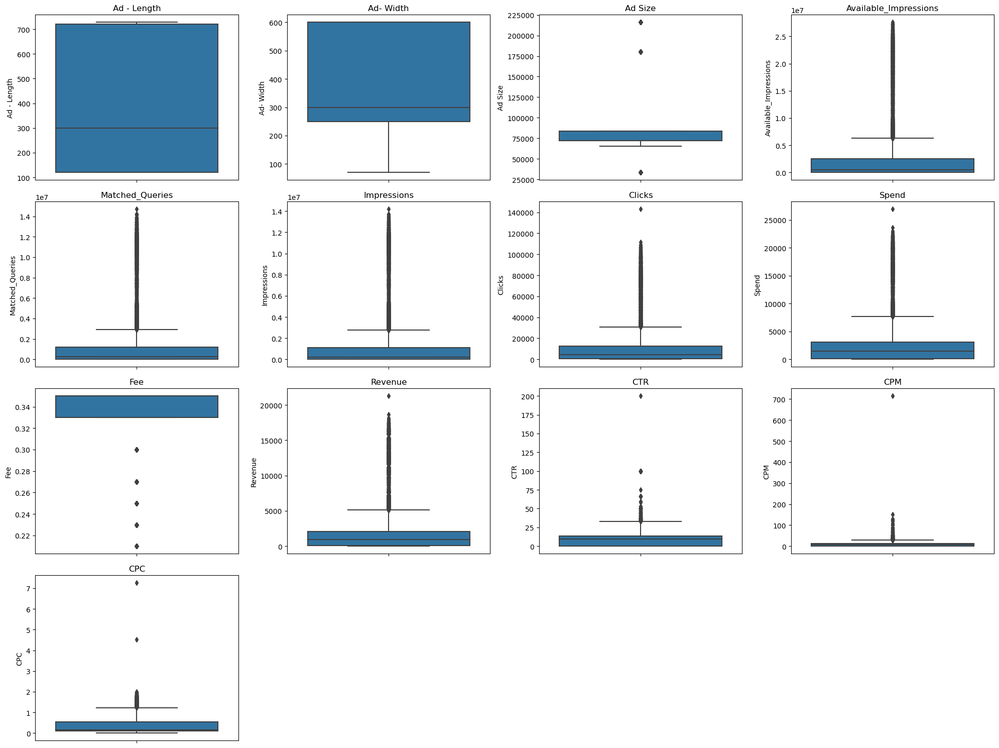

In [48]:
plt.figure(figsize = (20,15))
cols = ads_num.columns
for c in range(len(cols)):
    plt.subplot(4, 4, c + 1)
    sns.boxplot(data=ads_num, y=ads_num[cols[c]])
    plt.title(f'{cols[c]}')
    plt.tight_layout();

In [49]:
### there are a significant amount of outliers for each column except ad length and width

#### 4. Do you think treating outliers is necessary for K-Means clustering? Based on your judgement decide whether to treat outliers and if yes, which method to employ. (As an analyst your judgement may be different from another analyst).

In [50]:
### yes, outlier treatmeant is necessary for k-means clustering as it uses averaging of the observations in a 
### cluster, i.e., finding centroids over and over till the clusters have stabilized and no movement of the point 
### takes place between clusters 

In [51]:
def remove_outliers(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lr=Q1-(1.5*IQR)
    ur=Q3+(1.5*IQR)
    return lr, ur  

In [52]:
cols

Index(['Ad - Length', 'Ad- Width', 'Ad Size', 'Available_Impressions',
       'Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue',
       'CTR', 'CPM', 'CPC'],
      dtype='object')

In [53]:
l,u = remove_outliers(ads.Available_Impressions)
ads[ads.Available_Impressions>u].index.value_counts().sum()

2378

In [54]:
l,u = remove_outliers(ads.Matched_Queries)
ads[ads.Matched_Queries>u].index.value_counts().sum()

3192

In [55]:
l,u = remove_outliers(ads.Impressions)
ads[ads.Impressions>u].index.value_counts().sum()

3269

In [56]:
l,u = remove_outliers(ads.Clicks)
ads[ads.Clicks>u].index.value_counts().sum()

1691

In [57]:
l,u = remove_outliers(ads.Spend)
ads[ads.Spend>u].index.value_counts().sum()

2081

In [58]:
l,u = remove_outliers(ads.Fee)
ads[ads.Fee>u].index.value_counts().sum()

0

In [59]:
l,u = remove_outliers(ads.Revenue)
ads[ads.Revenue>u].index.value_counts().sum()

2325

In [60]:
l,u = remove_outliers(ads.CTR)
ads[ads.CTR>u].index.value_counts().sum()

275

In [61]:
l,u = remove_outliers(ads.CPM)
ads[ads.CPM>u].index.value_counts().sum()

207

In [62]:
l,u = remove_outliers(ads.CPC)
ads[ads.CPC>u].index.value_counts().sum()

585

In [63]:
l,u = remove_outliers(ads.Fee)
ads[ads.Fee<l].index.value_counts().sum()

3517

In [64]:
for c in cols:
    lrange,urange = remove_outliers(ads_num[c])
    ads_num[c] = np.where(ads_num[c] < lrange,lrange,ads_num[c])
    ads_num[c] = np.where(ads_num[c] > urange,urange,ads_num[c])

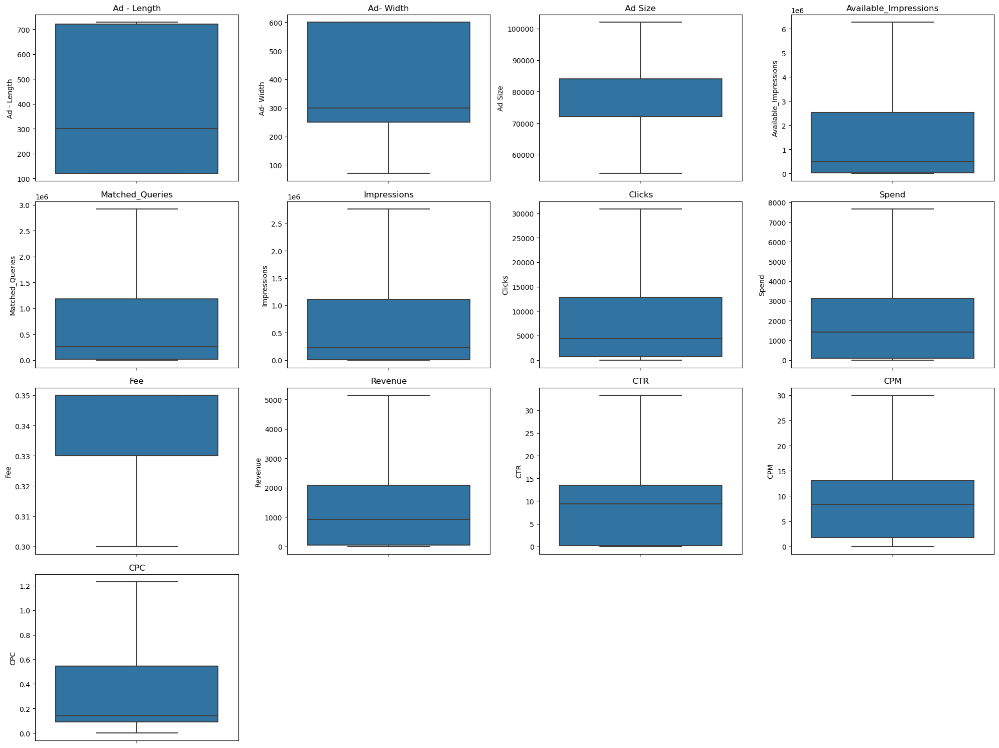

In [65]:
plt.figure(figsize = (20,15))
cols = ads_num.columns
for c in range(len(cols)):
    plt.subplot(4, 4, c + 1)
    sns.boxplot(data=ads_num, y=ads_num[cols[c]])
    plt.title(f'{cols[c]}')
    plt.tight_layout();

#### 5. Perform z-score scaling and discuss how it affects the speed of the algorithm.

In [66]:
from scipy.stats import zscore
scaled_ads = ads_num.apply(zscore)

In [67]:
scaled_ads.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,-4.030447e-15,1.000022,-1.134891,-1.134891,-0.364496,1.433093,1.467332
Ad- Width,23066.0,5.390161e-15,1.000022,-1.319110,-0.432797,-0.186599,1.290590,1.290590
Ad Size,23066.0,-4.156304e-15,1.000022,-1.467840,-0.297564,-0.297564,0.482620,1.652896
Available_Impressions,23066.0,-3.617510e-15,1.000022,-0.756182,-0.740341,-0.528577,0.433059,2.193158
Matched_Queries,23066.0,1.341008e-15,1.000022,-0.779265,-0.761447,-0.527722,0.371498,2.070914
Impressions,23066.0,-1.224345e-15,1.000022,-0.768806,-0.760655,-0.538975,0.366051,2.056111
Clicks,23066.0,1.960656e-15,1.000022,-0.867488,-0.793438,-0.405431,0.468629,2.361729
Spend,23066.0,1.250852e-15,1.000022,-0.893170,-0.858046,-0.305523,0.393932,2.271900
Fee,23066.0,-2.322121e-14,1.000022,-2.222416,-0.567532,0.535724,0.535724,0.535724
Revenue,23066.0,3.136228e-15,1.000022,-0.880093,-0.846474,-0.317607,0.389803,2.244218


In [68]:
scaled_ads.shape

(23066, 13)

In [69]:
scaled_ads.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.102518,-0.755333,-0.778949,-0.768478,-0.867488,-0.89317,0.535724,-0.880093,-0.958836,-1.194498,-1.042561
1,-0.364496,-0.432797,-0.102518,-0.755345,-0.778988,-0.768516,-0.867488,-0.89317,0.535724,-0.880093,-0.953835,-1.194498,-1.042561
2,-0.364496,-0.432797,-0.102518,-0.754900,-0.778919,-0.768445,-0.867488,-0.89317,0.535724,-0.880093,-0.962218,-1.194498,-1.042561
3,-0.364496,-0.432797,-0.102518,-0.755040,-0.778781,-0.768302,-0.867488,-0.89317,0.535724,-0.880093,-0.971871,-1.194498,-1.042561
4,-0.364496,-0.432797,-0.102518,-0.755610,-0.779030,-0.768560,-0.867488,-0.89317,0.535724,-0.880093,-0.946281,-1.194498,-1.042561


In [70]:
### yes, zscore standardization helps increase the speed of the algorithm.

### this is because it contains the value range of all dataset features from -4 to +4.

### this significantly decreases the processing required by the algorithm when
### compared to larger values that may be in hundreds or thousands before scaling.

### z-score standardization also makes all the features well suited to each other
### so it is efficient to compare them (in terms of distance, averages, etc) when clustering
### is being performed. if the value range for each feature differs, the accuracy of
### the algorithm is compromised.

### in short, z-score compresses the data by converting larger values into values ranging from -4 to +4.

### 6. Perform clustering and do the following:

#### a. Perform Hierarchical by constructing a Dendrogram using WARD and Euclidean distance.

In [71]:
scaled_ads.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.102518,-0.755333,-0.778949,-0.768478,-0.867488,-0.89317,0.535724,-0.880093,-0.958836,-1.194498,-1.042561
1,-0.364496,-0.432797,-0.102518,-0.755345,-0.778988,-0.768516,-0.867488,-0.89317,0.535724,-0.880093,-0.953835,-1.194498,-1.042561
2,-0.364496,-0.432797,-0.102518,-0.754900,-0.778919,-0.768445,-0.867488,-0.89317,0.535724,-0.880093,-0.962218,-1.194498,-1.042561
3,-0.364496,-0.432797,-0.102518,-0.755040,-0.778781,-0.768302,-0.867488,-0.89317,0.535724,-0.880093,-0.971871,-1.194498,-1.042561
4,-0.364496,-0.432797,-0.102518,-0.755610,-0.779030,-0.768560,-0.867488,-0.89317,0.535724,-0.880093,-0.946281,-1.194498,-1.042561


In [72]:
scaled_ads.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,-4.030447e-15,1.000022,-1.134891,-1.134891,-0.364496,1.433093,1.467332
Ad- Width,23066.0,5.390161e-15,1.000022,-1.319110,-0.432797,-0.186599,1.290590,1.290590
Ad Size,23066.0,-4.156304e-15,1.000022,-1.467840,-0.297564,-0.297564,0.482620,1.652896
Available_Impressions,23066.0,-3.617510e-15,1.000022,-0.756182,-0.740341,-0.528577,0.433059,2.193158
Matched_Queries,23066.0,1.341008e-15,1.000022,-0.779265,-0.761447,-0.527722,0.371498,2.070914
Impressions,23066.0,-1.224345e-15,1.000022,-0.768806,-0.760655,-0.538975,0.366051,2.056111
Clicks,23066.0,1.960656e-15,1.000022,-0.867488,-0.793438,-0.405431,0.468629,2.361729
Spend,23066.0,1.250852e-15,1.000022,-0.893170,-0.858046,-0.305523,0.393932,2.271900
Fee,23066.0,-2.322121e-14,1.000022,-2.222416,-0.567532,0.535724,0.535724,0.535724
Revenue,23066.0,3.136228e-15,1.000022,-0.880093,-0.846474,-0.317607,0.389803,2.244218


In [73]:
from scipy.cluster.hierarchy import dendrogram, linkage

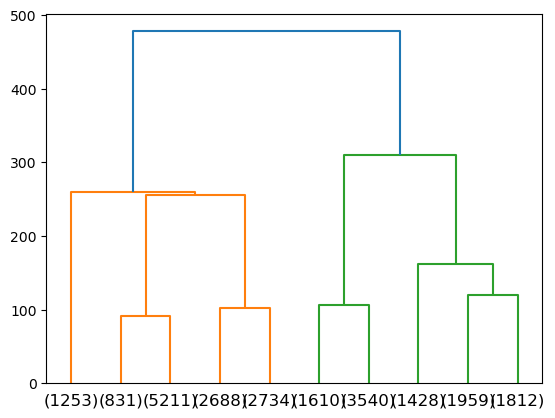

In [74]:
wlink = linkage(scaled_ads,method='ward',metric='euclidean')
dend = dendrogram(wlink,truncate_mode='lastp',p=10,)

In [75]:
### last 10 clusters in the dendrogram

In [76]:
# dend_original = dendrogram(wlink)

In [77]:
from scipy.cluster.hierarchy import fcluster

In [78]:
clusters = fcluster(wlink,5,criterion='maxclust')
clusters

array([4, 4, 4, ..., 3, 2, 3], dtype=int32)

#### b. Make Elbow plot (up to n=10) and identify optimum number of clusters for k-means algorithm.

In [79]:
from sklearn.cluster import KMeans

In [80]:
wcss=[]
for x in range(1,11):
    kmeans = KMeans(n_clusters=x,random_state=42)
    kmeans.fit(scaled_ads)
    wcss.append(kmeans.inertia_)
wcss

[299858.0000000002,
 183349.1020288608,
 130878.34240367352,
 95133.94481349865,
 61539.18919785385,
 51676.896816004584,
 44598.258497467934,
 39597.848136521905,
 36061.74016782992,
 33544.281618482746]

In [81]:
299858.0000000002 - 183349.1020288608
### WCSS cluster1 - WCSS cluster 2

116508.89797113938

In [82]:
183349.1020288608 - 130878.34240367355
### WCSS cluster2 - WCSS cluster 3

52470.759625187246

In [83]:
130878.34240367355 - 95133.94481349865
### WCSS cluster3 - WCSS cluster 4

35744.39759017491

In [84]:
95133.94481349865 - 61539.18919785385
### WCSS cluster4 - WCSS cluster 5

33594.7556156448

In [85]:
61539.18919785385 - 51676.896816004584
### WCSS cluster5 - WCSS cluster 6

### the drop from 5th to 6th cluster has significantly decreased
### therefore, we can take 5 as k for k-means clustering

9862.292381849264

In [86]:
### verifying the above conclusion with a pointplot

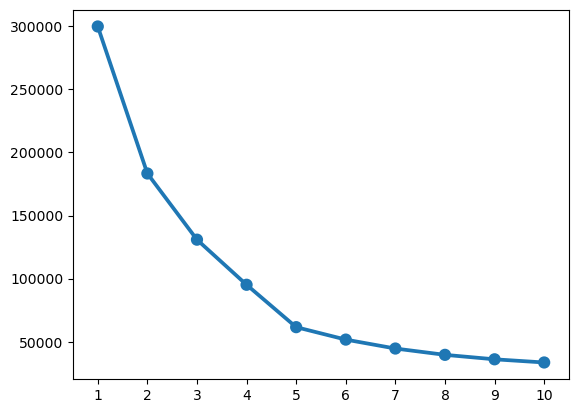

In [87]:
a=[1,2,3,4,5,6,7,8,9,10]
sns.pointplot(a, wcss);

In [88]:
### the optimum number of clusters in this scenario would be 5 as the drop in WCSS till 5 clusters is 
### 33594 and then drops to a difference of below 9862 from 3rd to 4th cluster.
### according to me, 5 would be an optimum choice of k-value for k-means clustering.

#### c. Print silhouette scores for up to 10 clusters and identify optimum number of clusters.

In [89]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [90]:
s_score = []
for y in range(2,11):
    k_means = KMeans(n_clusters=y,random_state=42)
    k_means.fit(scaled_ads)
    labels = k_means.labels_
    ssco = silhouette_score(scaled_ads,labels,random_state=42)
    s_score.append(ssco)
s_score

[0.38572769619101077,
 0.3825486036570082,
 0.44534371698609754,
 0.5240956940501831,
 0.5221533662938636,
 0.5165635029478517,
 0.4797524035378018,
 0.43186674723096125,
 0.44462846563808417]

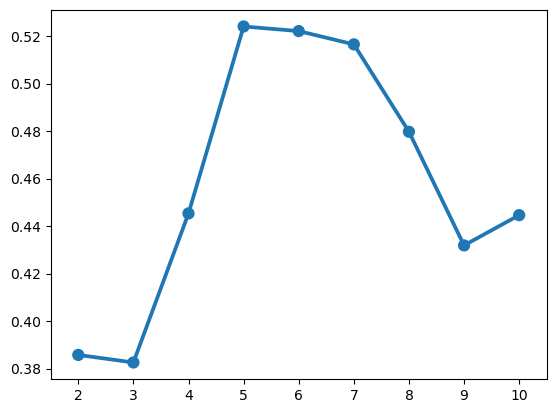

In [91]:
a=[2,3,4,5,6,7,8,9,10]
sns.pointplot(a, s_score);

In [92]:
### the optimum number of clusters, according to silhouette scores is 5.
### this can be seen due to 5 having the highest silhouette score.
### the closer the silhouette score to +1, better the segmentation of clusters.

#### d. Profile the ads based on optimum number of clusters using silhouette score and your domain understanding.
#### [Hint: Group the data by clusters and take sum or mean to identify trends in clicks, spend, revenue, CPM, CTR, & CPC based on Device Type. Make bar plots.]

In [93]:
scaled_ads.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.102518,-0.755333,-0.778949,-0.768478,-0.867488,-0.89317,0.535724,-0.880093,-0.958836,-1.194498,-1.042561
1,-0.364496,-0.432797,-0.102518,-0.755345,-0.778988,-0.768516,-0.867488,-0.89317,0.535724,-0.880093,-0.953835,-1.194498,-1.042561
2,-0.364496,-0.432797,-0.102518,-0.754900,-0.778919,-0.768445,-0.867488,-0.89317,0.535724,-0.880093,-0.962218,-1.194498,-1.042561
3,-0.364496,-0.432797,-0.102518,-0.755040,-0.778781,-0.768302,-0.867488,-0.89317,0.535724,-0.880093,-0.971871,-1.194498,-1.042561
4,-0.364496,-0.432797,-0.102518,-0.755610,-0.779030,-0.768560,-0.867488,-0.89317,0.535724,-0.880093,-0.946281,-1.194498,-1.042561


In [94]:
kmeans = KMeans(n_clusters=5,random_state=42)
kmeans.fit(scaled_ads)
labels = kmeans.labels_

In [95]:
labels

array([1, 1, 1, ..., 3, 2, 3])

In [96]:
ads_num['kmeans_cluster'] = labels
ads_num.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,kmeans_cluster
0,300.0,250.0,75000.0,1806.0,325.0,323.0,1.0,0.0,0.35,0.0,0.309598,0.0,0.0,1
1,300.0,250.0,75000.0,1780.0,285.0,285.0,1.0,0.0,0.35,0.0,0.350877,0.0,0.0,1
2,300.0,250.0,75000.0,2727.0,356.0,355.0,1.0,0.0,0.35,0.0,0.281690,0.0,0.0,1
3,300.0,250.0,75000.0,2430.0,497.0,495.0,1.0,0.0,0.35,0.0,0.202020,0.0,0.0,1
4,300.0,250.0,75000.0,1218.0,242.0,242.0,1.0,0.0,0.35,0.0,0.413223,0.0,0.0,1


In [97]:
ads_num.kmeans_cluster.value_counts()

2    6524
1    6275
3    4676
0    4054
4    1537
Name: kmeans_cluster, dtype: int64

In [98]:
sil_score = silhouette_score(scaled_ads,labels)
sil_score

### IMPORTANT to be included in the report

0.5240956940501831

In [99]:
ads_num['sil_width'] = silhouette_samples(scaled_ads,labels)

In [100]:
silhouette_samples(scaled_ads,labels).min()

-0.03709167751991964

In [101]:
ads_final = pd.concat([ads_num,ads_cat],axis=1,join='inner')

In [102]:
ads_final.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,...,CPM,CPC,kmeans_cluster,sil_width,Timestamp,InventoryType,Ad Type,Platform,Device Type,Format
0,300.0,250.0,75000.0,1806.0,325.0,323.0,1.0,0.0,0.35,0.0,...,0.0,0.0,1,0.142638,2020-9-2-17,Format1,Inter222,Video,Desktop,Display
1,300.0,250.0,75000.0,1780.0,285.0,285.0,1.0,0.0,0.35,0.0,...,0.0,0.0,1,0.142007,2020-9-2-10,Format1,Inter227,App,Mobile,Video
2,300.0,250.0,75000.0,2727.0,356.0,355.0,1.0,0.0,0.35,0.0,...,0.0,0.0,1,0.143092,2020-9-1-22,Format1,Inter222,Video,Desktop,Display
3,300.0,250.0,75000.0,2430.0,497.0,495.0,1.0,0.0,0.35,0.0,...,0.0,0.0,1,0.144273,2020-9-3-20,Format1,Inter228,Video,Mobile,Video
4,300.0,250.0,75000.0,1218.0,242.0,242.0,1.0,0.0,0.35,0.0,...,0.0,0.0,1,0.141021,2020-9-4-15,Format1,Inter217,Web,Desktop,Video


In [103]:
ads_final.duplicated().sum()

0

In [104]:
ads_final.to_csv('ads_final.csv')

In [105]:
clustered_ads = pd.read_csv('ads_final.csv')

In [106]:
clustered_ads.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,23066.0,1.153250e+04,6.658725e+03,0.000000,5766.250000,11532.500000,1.729875e+04,2.306500e+04
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.000000,120.000000,300.000000,7.200000e+02,7.280000e+02
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.000000,250.000000,300.000000,6.000000e+02,6.000000e+02
Ad Size,23066.0,7.657684e+04,1.538132e+04,54000.000000,72000.000000,72000.000000,8.400000e+04,1.020000e+05
Available_Impressions,23066.0,1.607253e+06,2.125528e+06,1.000000,33672.250000,483771.000000,2.527712e+06,6.268771e+06
Matched_Queries,23066.0,7.995380e+05,1.026037e+06,1.000000,18282.500000,258087.500000,1.180700e+06,2.924326e+06
Impressions,23066.0,7.536120e+05,9.802568e+05,1.000000,7990.500000,225290.000000,1.112428e+06,2.769086e+06
Clicks,23066.0,8.306828e+03,9.574779e+03,1.000000,710.000000,4425.000000,1.279375e+04,3.091938e+04
Spend,23066.0,2.166060e+03,2.425190e+03,0.000000,85.180000,1425.125000,3.121400e+03,7.675730e+03
Fee,23066.0,3.402883e-01,1.812855e-02,0.300000,0.330000,0.350000,3.500000e-01,3.500000e-01


In [107]:
clustered_ads[clustered_ads.kmeans_cluster==0]['sil_width'].min()

-0.0370916775199196

In [108]:
clustered_ads[clustered_ads.kmeans_cluster==1]['sil_width'].min()

-0.0271083534035679

In [109]:
clustered_ads[clustered_ads.kmeans_cluster==2]['sil_width'].min()

-0.0259949374048017

In [110]:
# checking_clusters_ads[checking_clusters_ads.kmeans_cluster==3]['sil_width'].min()

In [111]:
clustered_ads[clustered_ads.sil_width<0].index.value_counts().sum()
### sil_width is negative only for 52 observations, which is low given the size of the data set
### 0.002%

52

In [112]:
clustered_ads[clustered_ads.sil_width>0].index.value_counts().sum()

23014

In [113]:
clustered_ads[clustered_ads.sil_width>0.3].index.value_counts().sum()

20252

In [114]:
52/23066

0.0022544004161969998

In [115]:
clustered_ads.columns

Index(['Unnamed: 0', 'Ad - Length', 'Ad- Width', 'Ad Size',
       'Available_Impressions', 'Matched_Queries', 'Impressions', 'Clicks',
       'Spend', 'Fee', 'Revenue', 'CTR', 'CPM', 'CPC', 'kmeans_cluster',
       'sil_width', 'Timestamp', 'InventoryType', 'Ad Type', 'Platform',
       'Device Type', 'Format'],
      dtype='object')

In [116]:
clustered_ads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             23066 non-null  int64  
 1   Ad - Length            23066 non-null  float64
 2   Ad- Width              23066 non-null  float64
 3   Ad Size                23066 non-null  float64
 4   Available_Impressions  23066 non-null  float64
 5   Matched_Queries        23066 non-null  float64
 6   Impressions            23066 non-null  float64
 7   Clicks                 23066 non-null  float64
 8   Spend                  23066 non-null  float64
 9   Fee                    23066 non-null  float64
 10  Revenue                23066 non-null  float64
 11  CTR                    23066 non-null  float64
 12  CPM                    23066 non-null  float64
 13  CPC                    23066 non-null  float64
 14  kmeans_cluster         23066 non-null  int64  
 15  si

In [117]:
clustered_ads.isnull().sum()

Unnamed: 0               0
Ad - Length              0
Ad- Width                0
Ad Size                  0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
kmeans_cluster           0
sil_width                0
Timestamp                0
InventoryType            0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
dtype: int64

In [118]:
clustered_ads.duplicated().sum()

0

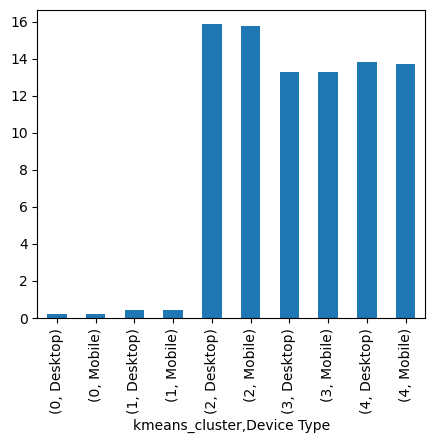

In [119]:
clustered_ads.groupby(['kmeans_cluster','Device Type']).mean()['CTR'].plot(kind='bar',figsize=(5,4));
### CTR is the highest for cluster-2, followed by cluster-4 and cluster-3
### for cluster-0 and cluster-1, the ad creatives/copy needs work as it could directly impact CTR positively

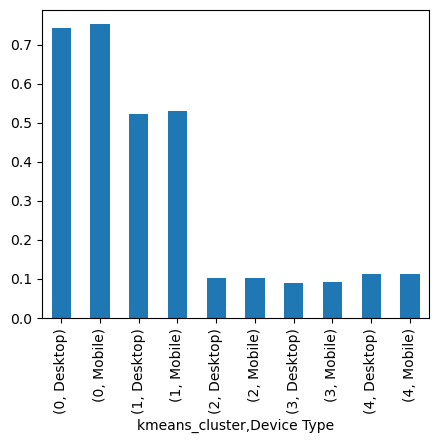

In [120]:
clustered_ads.groupby(['kmeans_cluster','Device Type']).mean()['CPC'].plot(kind='bar',figsize=(5,4));
### CPC is the lowest for cluster-3, cluster-2 and cluster-4

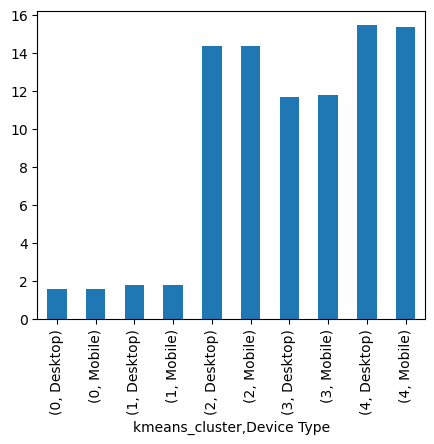

In [121]:
clustered_ads.groupby(['kmeans_cluster','Device Type']).mean()['CPM'].plot(kind='bar',figsize=(5,4));
### cluster-4 has the highest CPM, followed by cluster-2 and cluster-3.
### to lower the CPC further for the cluster-2, 3 and 4, the company can fine-tune its audience targeting. for example
### if cluster-2 belongs to a specific geography, then we know that within that geography, we can better
### out demographic targeting to lower CPM.
### this will serve relevant ads to relevant people within the geography, increasing clicks even more, and lowering CPC 
### and CPM further.

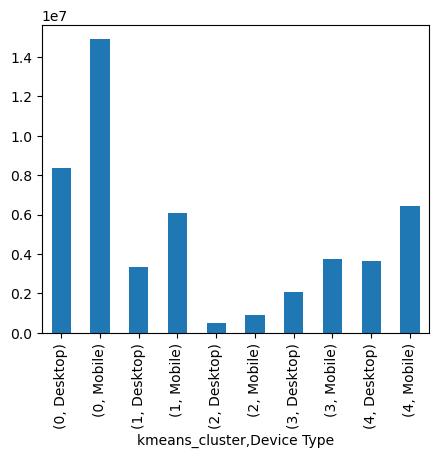

In [122]:
clustered_ads.groupby(['kmeans_cluster','Device Type']).sum()['Spend'].plot(kind='bar',figsize=(5,4));
### the lowest budget was spent to cluster-2, followed by cluster-3
### spends allocated to cluster-0 should be lower since it's giving high cost per click with very low click through rate

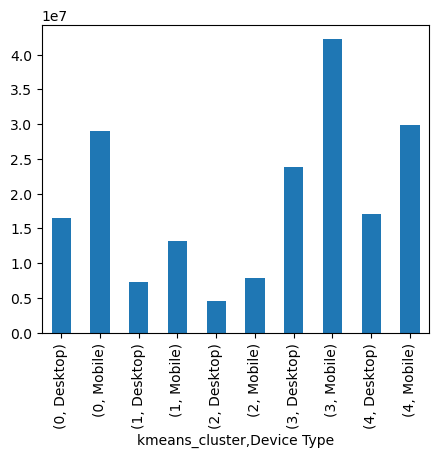

In [123]:
clustered_ads.groupby(['kmeans_cluster','Device Type']).sum()['Clicks'].plot(kind='bar',figsize=(5,4));
### the total number of clicks are the lowest for cluster-2 since the spends are the lowest for cluster-2

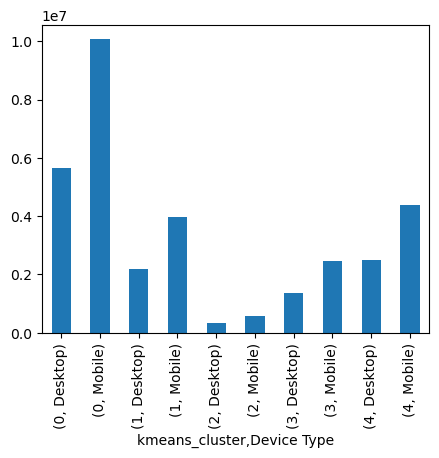

In [124]:
clustered_ads.groupby(['kmeans_cluster','Device Type']).sum()['Revenue'].plot(kind='bar',figsize=(5,4));
### most revenue comes from cluster-1
### cluster-1 is the most integral for revenue generation

#### e. Conclude the project by providing summary of your learnings.

In [125]:
### to be added directly to the report

### Part 2 - PCA: Read the data and perform basic checks like checking head, info, summary, nulls, and duplicates, etc.

In [126]:
df = pd.read_excel('PCA_India_Data_Census.xlsx')

In [127]:
df.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


In [128]:
df.tail()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
635,34,636,Puducherry,Mahe,3333,8154,11781,1146,1203,21,...,32,47,0,0,0,0,0,0,32,47
636,34,637,Puducherry,Karaikal,10612,12346,21691,1544,1533,2234,...,155,337,3,14,38,130,4,23,110,170
637,35,638,Andaman & Nicobar Island,Nicobars,1275,1549,2630,227,225,0,...,104,134,9,4,2,6,17,47,76,77
638,35,639,Andaman & Nicobar Island,North & Middle Andaman,3762,5200,8012,723,664,0,...,136,172,24,44,11,21,1,4,100,103
639,35,640,Andaman & Nicobar Island,South Andaman,7975,11977,18049,1470,1358,0,...,173,122,6,2,17,17,2,4,148,99


In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

In [130]:
df.shape

(640, 61)

In [131]:
df.isnull().sum()

State Code       0
Dist.Code        0
State            0
Area Name        0
No_HH            0
                ..
MARG_HH_0_3_F    0
MARG_OT_0_3_M    0
MARG_OT_0_3_F    0
NON_WORK_M       0
NON_WORK_F       0
Length: 61, dtype: int64

In [132]:
df.duplicated().sum()

0

In [133]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
State Code,640.0,17.114062,9.426486,1.0,9.00,18.0,24.00,35.0
Dist.Code,640.0,320.500000,184.896367,1.0,160.75,320.5,480.25,640.0
No_HH,640.0,51222.871875,48135.405475,350.0,19484.00,35837.0,68892.00,310450.0
TOT_M,640.0,79940.576563,73384.511114,391.0,30228.00,58339.0,107918.50,485417.0
TOT_F,640.0,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
M_06,640.0,12309.098438,11500.906881,56.0,4733.75,9159.0,16520.25,96223.0
F_06,640.0,11942.300000,11326.294567,56.0,4672.25,8663.0,15902.25,95129.0
M_SC,640.0,13820.946875,14426.373130,0.0,3466.25,9591.5,19429.75,103307.0
F_SC,640.0,20778.392188,21727.887713,0.0,5603.25,13709.0,29180.00,156429.0
M_ST,640.0,6191.807813,9912.668948,0.0,293.75,2333.5,7658.00,96785.0


### Part 2 - PCA: Perform detailed Exploratory analysis by creating certain questions like (i) Which state has highest gender ratio and which has the lowest? (ii) Which district has the highest & lowest gender ratio? (Example Questions). Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F

### Questions for EDA: 
#### 1. How much percentage of the total female population is working? 
#### Answer: 34%
#### 2. Is Literate female population outnumbering Iliterate female population in female-headed households? 
#### Answer: YES
#### 3. Is there a major difference between the population of Iliterate female and males? 
#### Answer: On an average, for every 38 illiterate males, there are 100 illiterate females. 
#### 4. How much of the Total Female population is Illiterate? 
#### Answer: 47%
#### 5. How much of the Total Female population is Literate? 
#### Answer: 51%

In [134]:
df_EDA = pd.DataFrame(df,columns=['TOT_F','F_LIT','M_ILL','F_ILL','TOT_WORK_F'])

In [135]:
df_EDA.head()

,TOT_F,F_LIT,M_ILL,F_ILL,TOT_WORK_F
0,29796,11364,10007,18432,3752
1,23102,7891,9072,15211,4200
2,10964,5840,2012,5124,4800
3,4206,1962,942,2244,1118
4,29981,13477,7348,16504,7692


In [136]:
df_EDA.describe().T

,count,mean,std,min,25%,50%,75%,max
TOT_F,640.0,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
F_LIT,640.0,66359.565625,75037.860207,371.0,20932.00,43796.5,84799.75,571140.0
M_ILL,640.0,21972.596875,19825.605268,105.0,8590.00,15767.5,29512.50,105961.0
F_ILL,640.0,56012.518750,47116.693769,327.0,22367.00,42386.0,78471.00,254160.0
TOT_WORK_F,640.0,41295.760938,37192.360943,357.0,16097.75,30588.5,53234.25,257848.0


In [137]:
df_EDA.duplicated().sum()

0

In [138]:
df_EDA.isnull().sum()

TOT_F         0
F_LIT         0
M_ILL         0
F_ILL         0
TOT_WORK_F    0
dtype: int64

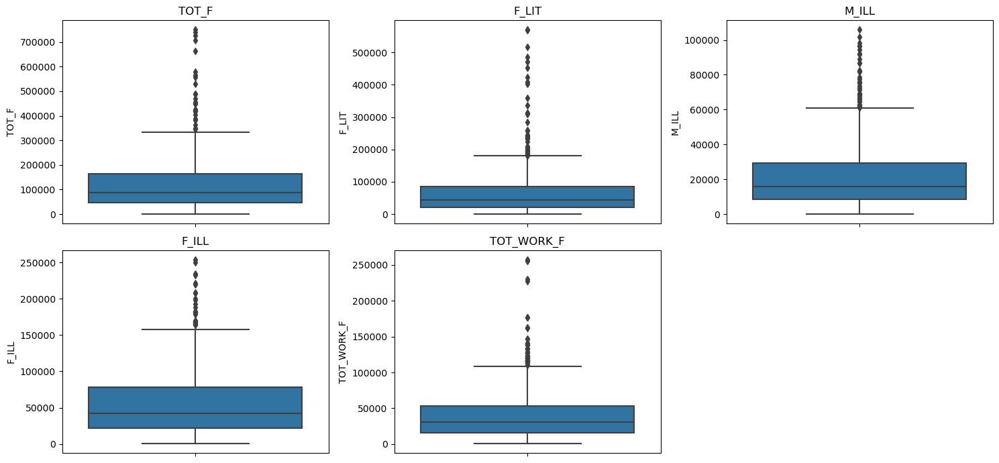

In [139]:
plt.figure(figsize=(15,7))
col=df_EDA.columns
for c in range(len(col)):
    plt.subplot(2, 3, c + 1)
    sns.boxplot(data=df_EDA,y=df_EDA[col[c]])
    plt.title(f'{col[c]}')
    plt.tight_layout();

In [140]:
def remove_outliers(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lr=Q1-(1.5*IQR)
    ur=Q3+(1.5*IQR)
    return lr, ur

In [141]:
for c in col:
    lower_r,upper_r = remove_outliers(df_EDA[c])
    df_EDA[c] = np.where(df_EDA[c] < lower_r,lower_r,df_EDA[c])
    df_EDA[c] = np.where(df_EDA[c] > upper_r,upper_r,df_EDA[c])

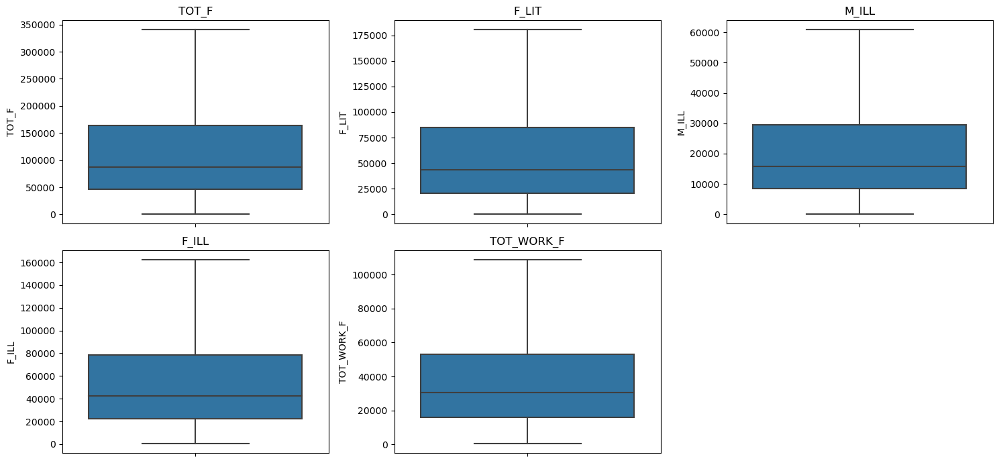

In [142]:
plt.figure(figsize=(15,7))
col=df_EDA.columns
for c in range(len(col)):
    plt.subplot(2, 3, c + 1)
    sns.boxplot(data=df_EDA,y=df_EDA[col[c]])
    plt.title(f'{col[c]}')
    plt.tight_layout();

In [143]:
df_EDA.columns

Index(['TOT_F', 'F_LIT', 'M_ILL', 'F_ILL', 'TOT_WORK_F'], dtype='object')

In [144]:
total_females = df_EDA.TOT_F.sum()
total_females

74291077.5

In [145]:
total_working_females = df_EDA.TOT_WORK_F.sum()
total_working_females

25109260.0

In [146]:
total_literate_females = df_EDA.F_LIT.sum()
total_literate_females

38182548.875

In [147]:
total_illiterate_females = df_EDA.F_ILL.sum()
total_illiterate_females

35062879.0

In [148]:
total_illiterate_males = df_EDA.M_ILL.sum()
total_illiterate_males

13450152.75

In [149]:
### ratios:

In [150]:
(total_illiterate_females/total_females)*100

47.196621963115284

In [151]:
(total_literate_females/total_females)*100

51.39587439016482

In [152]:
### there is only a minor gap between literate and illiterate females, with literate females leading by 4%

In [153]:
(total_illiterate_males/total_illiterate_females)*100
### illiteracy in males is only 38% of that in females
### this means that the illiteracy rate amongst females is much higher than amongst males

38.36009230730882

In [154]:
(total_working_females/total_females)*100
### 34% of the total female population is working

33.79848676982778

In [155]:
corr = df_EDA.corr()
round(corr,2)

### there seems to be a high correlation between literate and working females
### there does not seem to be a weak correlation between illiterate and working females, which means that even
### females who are illiterate are able to contribute to the working female population

,TOT_F,F_LIT,M_ILL,F_ILL,TOT_WORK_F
TOT_F,1.00,0.96,0.88,0.93,0.90
F_LIT,0.96,1.00,0.77,0.80,0.85
M_ILL,0.88,0.77,1.00,0.93,0.71
F_ILL,0.93,0.80,0.93,1.00,0.87
TOT_WORK_F,0.90,0.85,0.71,0.87,1.00


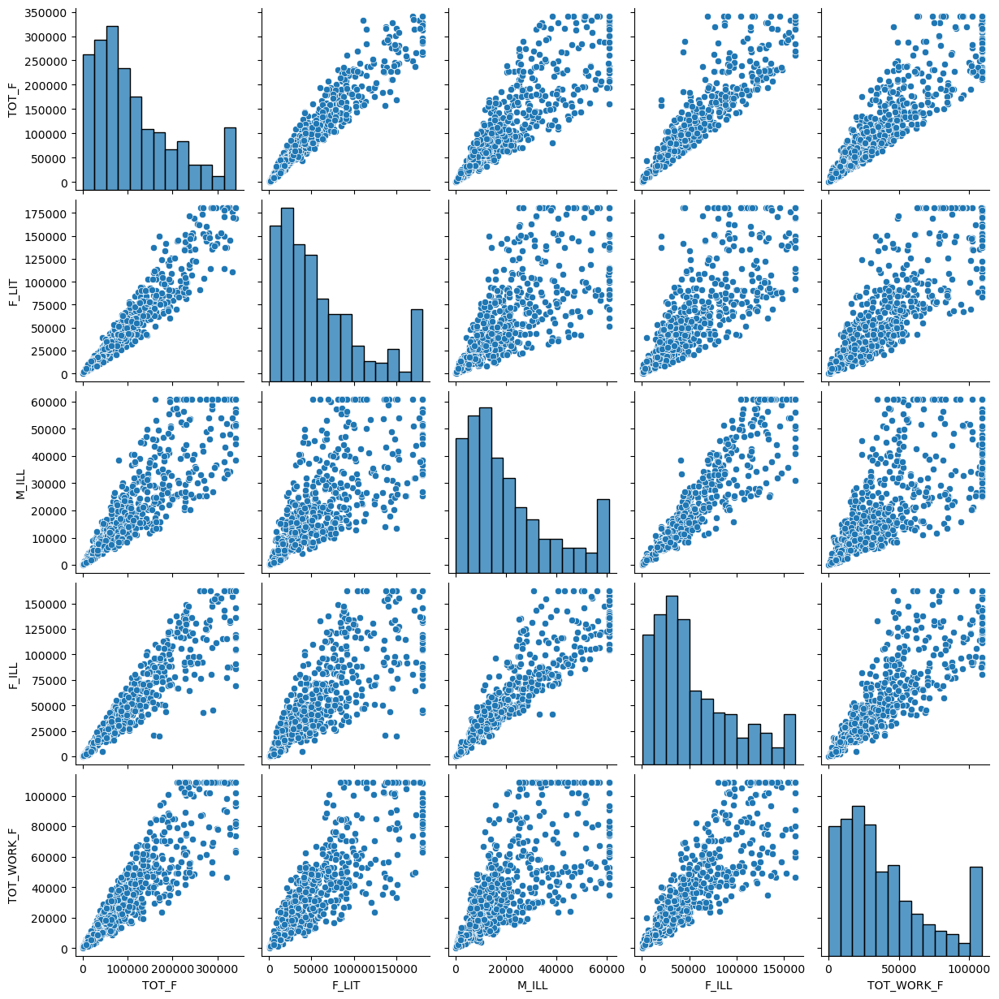

In [156]:
sns.pairplot(df_EDA)

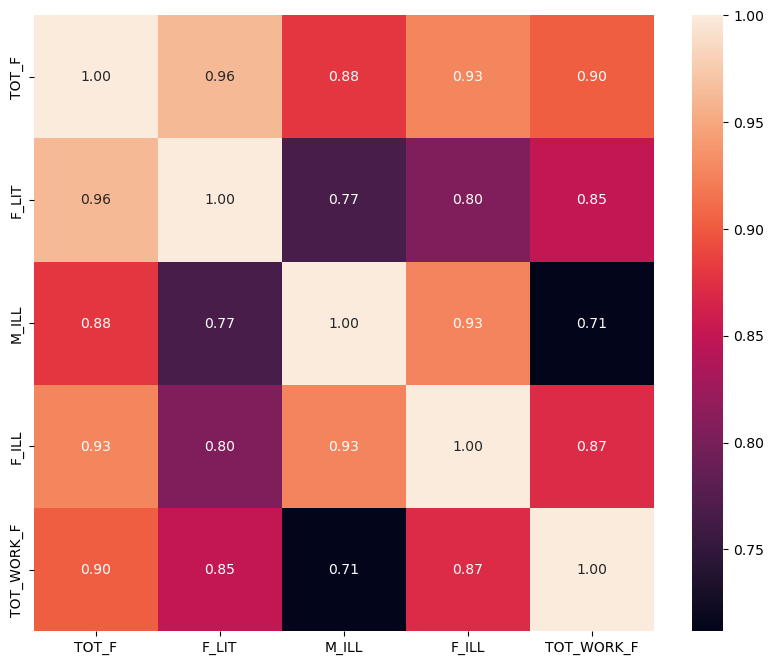

In [157]:
fig=plt.figure(figsize=(10,8))
sns.heatmap(df_EDA.corr(), annot=True,fmt='.2f');

In [158]:
### break ###

In [159]:
### break ###

In [160]:
### break ###

In [161]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [162]:
print(pd.__version__)
print(np.__version__)
print(sns.__version__)

1.4.3
1.21.5
0.11.2


In [163]:
df_pca_with_outliers = df.drop(['State', 'Area Name', 'State Code', 'Dist.Code'],axis=1)

In [164]:
df_pca_with_outliers.head(10)

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,7707,23388,29796,5862,6196,3,0,1999,2598,13381,...,1150,749,180,237,680,252,32,46,258,214
1,6218,19585,23102,4482,3733,7,6,427,517,10513,...,525,715,123,229,186,148,76,178,140,160
2,4452,6546,10964,1082,1018,3,6,5806,9723,4534,...,114,188,44,89,3,34,0,4,67,61
3,1320,2784,4206,563,677,0,0,2666,3968,1842,...,194,247,61,128,13,50,4,10,116,59
4,11654,20591,29981,5157,4587,20,33,7670,10843,13243,...,874,1928,465,1043,205,302,24,105,180,478
5,16345,25290,37426,6155,5294,2588,4000,7796,11111,16471,...,1808,3536,1277,2374,229,256,19,71,283,835
6,12510,22793,30491,3928,3200,5357,6906,988,1311,16735,...,502,561,160,283,133,120,11,19,198,139
7,9414,22960,30509,4246,4099,0,0,945,1180,14692,...,849,878,168,321,385,265,50,94,246,198
8,3814,10319,13058,1646,1779,0,0,1749,2308,5820,...,515,901,108,280,218,234,49,144,140,243
9,15095,39014,52278,6269,5704,11,3,200,237,25837,...,308,432,10,29,36,22,16,134,246,247


In [165]:
df_pca_with_outliers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 57 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   No_HH           640 non-null    int64
 1   TOT_M           640 non-null    int64
 2   TOT_F           640 non-null    int64
 3   M_06            640 non-null    int64
 4   F_06            640 non-null    int64
 5   M_SC            640 non-null    int64
 6   F_SC            640 non-null    int64
 7   M_ST            640 non-null    int64
 8   F_ST            640 non-null    int64
 9   M_LIT           640 non-null    int64
 10  F_LIT           640 non-null    int64
 11  M_ILL           640 non-null    int64
 12  F_ILL           640 non-null    int64
 13  TOT_WORK_M      640 non-null    int64
 14  TOT_WORK_F      640 non-null    int64
 15  MAINWORK_M      640 non-null    int64
 16  MAINWORK_F      640 non-null    int64
 17  MAIN_CL_M       640 non-null    int64
 18  MAIN_CL_F       640 non-null  

In [166]:
df_pca_with_outliers.isnull().sum()

No_HH             0
TOT_M             0
TOT_F             0
M_06              0
F_06              0
M_SC              0
F_SC              0
M_ST              0
F_ST              0
M_LIT             0
F_LIT             0
M_ILL             0
F_ILL             0
TOT_WORK_M        0
TOT_WORK_F        0
MAINWORK_M        0
MAINWORK_F        0
MAIN_CL_M         0
MAIN_CL_F         0
MAIN_AL_M         0
MAIN_AL_F         0
MAIN_HH_M         0
MAIN_HH_F         0
MAIN_OT_M         0
MAIN_OT_F         0
MARGWORK_M        0
MARGWORK_F        0
MARG_CL_M         0
MARG_CL_F         0
MARG_AL_M         0
MARG_AL_F         0
MARG_HH_M         0
MARG_HH_F         0
MARG_OT_M         0
MARG_OT_F         0
MARGWORK_3_6_M    0
MARGWORK_3_6_F    0
MARG_CL_3_6_M     0
MARG_CL_3_6_F     0
MARG_AL_3_6_M     0
MARG_AL_3_6_F     0
MARG_HH_3_6_M     0
MARG_HH_3_6_F     0
MARG_OT_3_6_M     0
MARG_OT_3_6_F     0
MARGWORK_0_3_M    0
MARGWORK_0_3_F    0
MARG_CL_0_3_M     0
MARG_CL_0_3_F     0
MARG_AL_0_3_M     0


In [167]:
df_pca_with_outliers.duplicated().sum()

0

In [168]:
df_pca_with_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.0,51222.871875,48135.405475,350.0,19484.00,35837.0,68892.00,310450.0
TOT_M,640.0,79940.576563,73384.511114,391.0,30228.00,58339.0,107918.50,485417.0
TOT_F,640.0,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
M_06,640.0,12309.098438,11500.906881,56.0,4733.75,9159.0,16520.25,96223.0
F_06,640.0,11942.300000,11326.294567,56.0,4672.25,8663.0,15902.25,95129.0
M_SC,640.0,13820.946875,14426.373130,0.0,3466.25,9591.5,19429.75,103307.0
F_SC,640.0,20778.392188,21727.887713,0.0,5603.25,13709.0,29180.00,156429.0
M_ST,640.0,6191.807813,9912.668948,0.0,293.75,2333.5,7658.00,96785.0
F_ST,640.0,10155.640625,15875.701488,0.0,429.50,3834.5,12480.25,130119.0
M_LIT,640.0,57967.979688,55910.282466,286.0,21298.00,42693.5,77989.50,403261.0


In [169]:
print(f'Number of columns: {df_pca_with_outliers.shape[1]}')
### number of features

Number of columns: 57


#### Part 2 - PCA: We choose not to treat outliers for this case. Do you think that treating outliers for this case is necessary?

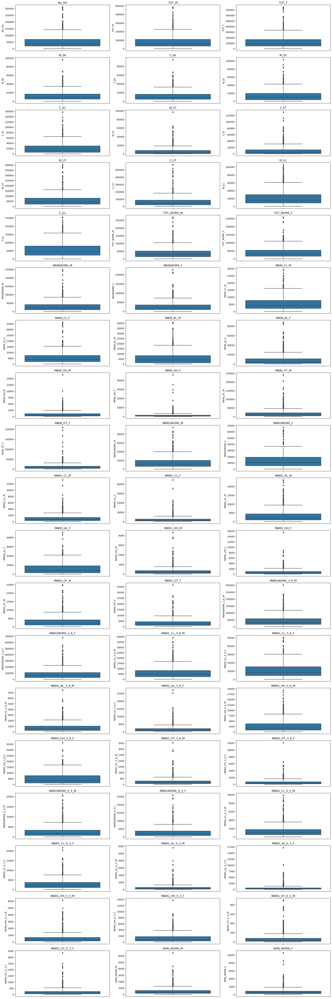

In [170]:
plt.figure(figsize = (20,60))
feature_list = df_pca_with_outliers.columns
for i in range(len(feature_list)):
    plt.subplot(19, 3, i + 1)
    sns.boxplot(y = df_pca_with_outliers[feature_list[i]], data = df_pca_with_outliers)
    plt.title((feature_list[i]))
    plt.tight_layout()

In [171]:
### this is how outliers can be treated:
#for f in feature_list:
#    lower_range,upper_range = remove_outliers(df_pca_with_outliers[f])
#    df_pca_with_outliers[f] = np.where(df_pca_with_outliers[f] < lower_range,lower_range,df_pca_with_outliers[f])
#    df_pca_with_outliers[f] = np.where(df_pca_with_outliers[f] > upper_range,upper_range,df_pca_with_outliers[f])

In [172]:
#plt.figure(figsize = (20,60))
#feature_list = df_pca_with_outliers.columns
#for i in range(len(feature_list)):
#    plt.subplot(19, 3, i + 1)
#    sns.boxplot(y = df_pca_with_outliers[feature_list[i]], data = df_pca_with_outliers)
#    plt.title((feature_list[i]))
#    plt.tight_layout()

### It is important to treat outliers because PCA is sensitive to outliers.
### Moreover, outliers affect the efficiency and working of a machine learning model.
### Hence, it is important to treat outliers.

In [173]:
### break ###

### Part 2 - PCA: Scale the Data using z-score method. Does scaling have any impact on outliers? Compare boxplots before and after scaling and comment.

In [174]:
from scipy.stats import zscore
df_pca_scaled = df_pca_with_outliers.apply(zscore)

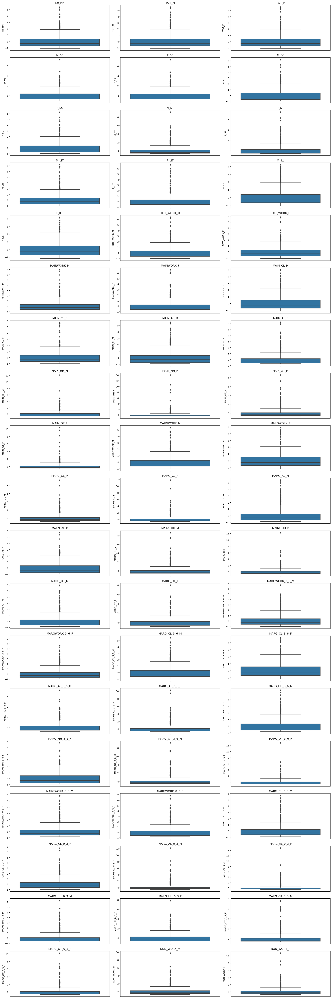

In [175]:
plt.figure(figsize = (20,60))
features = df_pca_scaled.columns
for i in range(len(features)):
    plt.subplot(19, 3, i + 1)
    sns.boxplot(y = df_pca_scaled[features[i]], data = df_pca_scaled)
    plt.title((features[i]))
    plt.tight_layout()

### No, the boxplots of the data before and after scaling had no difference in their outliers.
### Hence, scaling did not have an impact on the outliers.

In [176]:
### Treating the outliers and rescaling the data, since PCA is not tolerant to outliers.

In [177]:
df_pca = df_pca_with_outliers
for f in feature_list:    
    lower_range,upper_range = remove_outliers(df_pca[f])
    df_pca[f] = np.where(df_pca[f] < lower_range,lower_range,df_pca[f])
    df_pca[f] = np.where(df_pca[f] > upper_range,upper_range,df_pca[f])

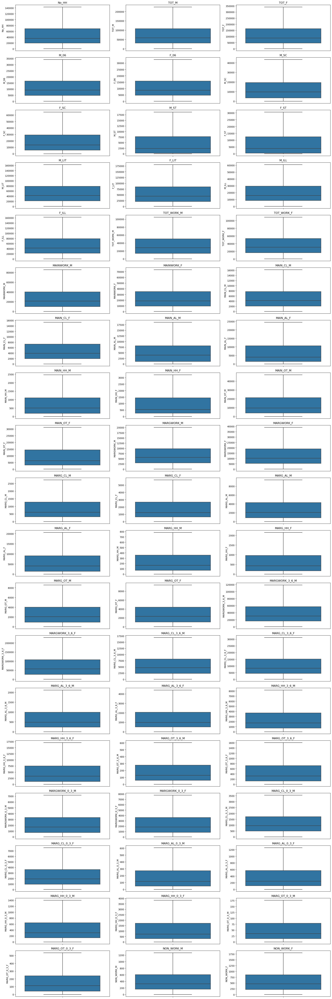

In [178]:
plt.figure(figsize = (20,60))
feature_list = df_pca.columns
for i in range(len(feature_list)):
    plt.subplot(19, 3, i + 1)
    sns.boxplot(y = df_pca[feature_list[i]], data = df_pca)
    plt.title((feature_list[i]))
    plt.tight_layout()

In [179]:
from scipy.stats import zscore
df_pca_scaled = df_pca.apply(zscore)

In [180]:
df_pca_scaled.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-1.038986,-0.874837,-0.937027,-0.624685,-0.561282,-1.080201,-1.079963,-0.510440,-0.574198,-0.939617,...,-0.093587,-0.860882,-0.041800,-0.423378,0.523468,-0.793688,-0.443385,-0.756991,-0.497493,-0.774865
1,-1.076896,-0.938023,-1.009723,-0.773932,-0.835657,-1.079873,-1.079635,-0.771833,-0.782092,-1.005083,...,-0.719169,-0.877096,-0.347040,-0.443790,-0.634478,-0.884805,0.358782,0.088391,-0.813235,-0.880662
2,-1.121858,-1.154665,-1.141539,-1.141642,-1.138104,-1.080201,-1.079635,0.122588,0.137599,-1.141561,...,-1.130551,-1.128423,-0.770091,-0.800999,-1.063434,-0.984684,-1.026779,-1.025976,-1.008568,-1.074622
3,-1.201599,-1.217171,-1.214930,-1.197772,-1.176091,-1.080447,-1.079963,-0.399531,-0.437333,-1.203009,...,-1.050477,-1.100286,-0.679055,-0.701491,-1.039994,-0.970666,-0.953855,-0.987550,-0.877454,-1.078541
4,-0.938495,-0.921309,-0.935018,-0.700931,-0.740523,-1.078807,-1.078160,0.432534,0.249489,-0.942767,...,-0.369844,-0.298617,1.484398,1.633130,-0.589942,-0.749882,-0.589234,-0.379131,-0.706204,-0.257637


In [181]:
df_pca_scaled.describe()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
count,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,...,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02,6.400000e+02
mean,-1.516148e-16,1.457168e-17,8.881784e-17,3.295975e-17,-6.626644e-17,-5.342948e-17,8.673617e-17,-9.037909e-17,-1.144917e-16,-2.040035e-16,...,1.280226e-16,-2.393918e-17,2.411266e-17,-3.396589e-16,3.747003e-17,-7.598089e-17,5.030698e-18,-2.005340e-16,2.949030e-18,-3.191891e-17
std,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,...,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00,1.000782e+00
min,-1.226295e+00,-1.256930e+00,-1.253026e+00,-1.252604e+00,-1.245270e+00,-1.080447e+00,-1.079963e+00,-8.428341e-01,-8.337412e-01,-1.238527e+00,...,-1.240654e+00,-1.203773e+00,-1.005714e+00,-1.028083e+00,-1.070466e+00,-1.014472e+00,-1.026779e+00,-1.051594e+00,-1.187845e+00,-1.184337e+00
25%,-7.391433e-01,-7.611904e-01,-7.554317e-01,-7.467051e-01,-7.310260e-01,-7.961502e-01,-7.737908e-01,-7.939894e-01,-7.908336e-01,-7.589016e-01,...,-7.547019e-01,-7.615673e-01,-7.540257e-01,-7.499694e-01,-7.505070e-01,-7.533861e-01,-7.715445e-01,-7.762044e-01,-7.570439e-01,-7.621304e-01
50%,-3.227958e-01,-2.941277e-01,-3.079337e-01,-2.681143e-01,-2.864623e-01,-2.937658e-01,-3.308769e-01,-4.548195e-01,-4.506696e-01,-2.705225e-01,...,-2.947741e-01,-2.986165e-01,-3.925577e-01,-3.965870e-01,-3.485074e-01,-3.862889e-01,-3.886921e-01,-3.278957e-01,-3.155397e-01,-2.840865e-01
75%,5.187848e-01,5.296328e-01,5.231388e-01,5.280048e-01,5.199796e-01,5.131537e-01,5.144885e-01,4.305389e-01,4.130522e-01,5.351530e-01,...,4.709380e-01,4.986411e-01,4.441736e-01,4.230817e-01,4.343956e-01,4.843624e-01,4.134749e-01,4.854642e-01,4.296660e-01,4.780408e-01
max,2.405677e+00,2.465868e+00,2.440995e+00,2.440070e+00,2.396488e+00,2.477110e+00,2.446907e+00,2.267331e+00,2.218881e+00,2.476235e+00,...,2.309398e+00,2.388954e+00,2.241473e+00,2.182658e+00,2.211749e+00,2.340985e+00,2.191004e+00,2.377967e+00,2.209731e+00,2.338298e+00


In [182]:
corr_pca = df_pca_scaled.corr()
round(corr_pca,2)

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
No_HH,1.00,0.91,0.97,0.81,0.81,0.81,0.86,0.12,0.12,0.93,...,0.60,0.62,0.09,0.08,0.44,0.49,0.60,0.65,0.77,0.80
TOT_M,0.91,1.00,0.98,0.96,0.96,0.88,0.86,0.02,0.01,0.99,...,0.74,0.64,0.23,0.19,0.54,0.48,0.76,0.73,0.86,0.79
TOT_F,0.97,0.98,1.00,0.91,0.91,0.86,0.88,0.08,0.07,0.98,...,0.70,0.65,0.18,0.16,0.51,0.51,0.70,0.71,0.84,0.81
M_06,0.81,0.96,0.91,1.00,1.00,0.83,0.80,-0.01,-0.02,0.92,...,0.80,0.68,0.35,0.31,0.62,0.53,0.80,0.74,0.83,0.73
F_06,0.81,0.96,0.91,1.00,1.00,0.82,0.79,0.01,-0.01,0.91,...,0.80,0.69,0.36,0.31,0.64,0.55,0.81,0.75,0.82,0.73
M_SC,0.81,0.88,0.86,0.83,0.82,1.00,0.98,-0.10,-0.10,0.87,...,0.65,0.55,0.19,0.15,0.49,0.44,0.69,0.66,0.76,0.69
F_SC,0.86,0.86,0.88,0.80,0.79,0.98,1.00,-0.05,-0.05,0.86,...,0.62,0.57,0.15,0.13,0.48,0.48,0.66,0.65,0.73,0.70
M_ST,0.12,0.02,0.08,-0.01,0.01,-0.10,-0.05,1.00,0.99,0.03,...,0.09,0.20,0.09,0.09,0.16,0.27,-0.03,-0.01,0.07,0.17
F_ST,0.12,0.01,0.07,-0.02,-0.01,-0.10,-0.05,0.99,1.00,0.02,...,0.08,0.21,0.07,0.08,0.17,0.29,-0.04,-0.02,0.05,0.16
M_LIT,0.93,0.99,0.98,0.92,0.91,0.87,0.86,0.03,0.02,1.00,...,0.69,0.60,0.19,0.15,0.47,0.43,0.70,0.70,0.87,0.80


### Part 2 - PCA: Perform all the required steps for PCA (use sklearn only). Create the covariance Matrix Get eigen values and eigen vector.

In [183]:
# sns.pairplot(df_pca_scaled)

In [184]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(df_pca_scaled)
p_value

0.0

In [185]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(df_pca_scaled)
kmo_model
# import warnings
# warnings.filterwarnings("ignore")

0.9361896166653038

In [186]:
from sklearn.decomposition import PCA
pca = PCA(n_components=57, random_state=42)
pca_transformed = pca.fit_transform(df_pca_scaled)

In [187]:
### eigen vectors for all 57 PCs
pca.components_

array([[ 0.14922158,  0.15916917,  0.15820921, ...,  0.14136961,
         0.14762899,  0.14210263],
       [-0.11548673, -0.08023879, -0.09371751, ...,  0.03510934,
        -0.04912234, -0.03984815],
       [ 0.1015276 , -0.03866173,  0.0289595 , ..., -0.10217491,
        -0.12667281, -0.02854464],
       ...,
       [ 0.00112879, -0.00673066,  0.02298648, ..., -0.01159627,
         0.05608352, -0.00610478],
       [ 0.00070908,  0.04637872,  0.00402434, ...,  0.01406358,
        -0.07729171, -0.00056173],
       [-0.00461221, -0.00370327,  0.00963954, ...,  0.00227908,
         0.00539901,  0.00130606]])

In [188]:
### eigen values in descending order
pca.explained_variance_

array([3.56488638e+01, 7.64357559e+00, 3.76919551e+00, 2.77722349e+00,
       1.90694892e+00, 1.15490310e+00, 9.87726707e-01, 4.64629906e-01,
       3.96708513e-01, 3.22346888e-01, 2.73207369e-01, 2.35647574e-01,
       1.81401107e-01, 1.69243770e-01, 1.38592325e-01, 1.31505852e-01,
       1.03809666e-01, 9.55333831e-02, 8.58580407e-02, 8.09138742e-02,
       6.60179067e-02, 6.30797999e-02, 4.82756124e-02, 4.59506197e-02,
       4.37747566e-02, 3.19339710e-02, 2.86194563e-02, 2.75481445e-02,
       2.34340044e-02, 2.20296816e-02, 1.87487040e-02, 1.59004895e-02,
       1.39957919e-02, 1.18916465e-02, 1.11133495e-02, 9.07842645e-03,
       7.25127869e-03, 6.27213692e-03, 4.95541908e-03, 4.60667097e-03,
       3.45902033e-03, 2.18408510e-03, 2.13514664e-03, 1.92111328e-03,
       1.43840980e-03, 1.09968912e-03, 9.65752052e-04, 8.62630267e-04,
       6.51634478e-04, 5.76658846e-04, 4.35790607e-04, 3.70037468e-04,
       3.06660171e-04, 2.07854170e-04, 1.38286484e-04, 8.97034441e-05,
      

In [189]:
### extracting the explained variance for each PC
pca.explained_variance_ratio_

array([6.24441446e-01, 1.33888289e-01, 6.60229147e-02, 4.86470891e-02,
       3.34029704e-02, 2.02297994e-02, 1.73014629e-02, 8.13866529e-03,
       6.94892379e-03, 5.64637229e-03, 4.78562250e-03, 4.12770833e-03,
       3.17750294e-03, 2.96454958e-03, 2.42764517e-03, 2.30351534e-03,
       1.81837655e-03, 1.67340548e-03, 1.50392785e-03, 1.41732362e-03,
       1.15639919e-03, 1.10493400e-03, 8.45617224e-04, 8.04891611e-04,
       7.66778221e-04, 5.59369722e-04, 5.01311201e-04, 4.82545623e-04,
       4.10480504e-04, 3.85881758e-04, 3.28410688e-04, 2.78520087e-04,
       2.45156553e-04, 2.08299401e-04, 1.94666401e-04, 1.59021779e-04,
       1.27016642e-04, 1.09865556e-04, 8.68013375e-05, 8.06925096e-05,
       6.05897475e-05, 3.82574118e-05, 3.74001838e-05, 3.36510796e-05,
       2.51958296e-05, 1.92626466e-05, 1.69165450e-05, 1.51102177e-05,
       1.14143210e-05, 1.01010143e-05, 7.63350323e-06, 6.48174183e-06,
       5.37159674e-06, 3.64086663e-06, 2.42228792e-06, 1.57128566e-06,
      

In [190]:
def pcs():
    columns=[]
    for p in range(1,58):
        pc = f'PC{p}'
        columns.append(pc)
    return columns

In [191]:
df_extracted_loadings = pd.DataFrame(pca.components_.T, 
                                     columns = pcs(),
                                    index = df_pca_scaled.columns)

In [192]:
df_extracted_loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57
No_HH,0.149222,-0.115487,0.101528,0.076814,-0.012090,0.082558,0.106896,-0.099515,0.026100,0.068124,...,0.143407,0.018238,0.020488,0.022458,-0.013491,0.024055,0.003553,0.001129,0.000709,-0.004612
TOT_M,0.159169,-0.080239,-0.038662,0.052976,-0.042344,0.073667,-0.124085,-0.108870,0.032856,-0.048423,...,0.082872,-0.094480,-0.064053,0.713573,0.172649,0.187487,-0.026231,-0.006731,0.046379,-0.003703
TOT_F,0.158209,-0.093718,0.028959,0.070022,-0.022927,0.082812,-0.010291,-0.115276,0.036405,-0.022468,...,-0.340524,-0.015371,0.061267,-0.220535,0.062616,-0.054112,0.004109,0.022986,0.004024,0.009640
M_06,0.156340,-0.020341,-0.074419,0.028520,-0.080339,0.092379,-0.200807,-0.132944,0.138404,-0.157252,...,-0.654327,-0.027481,0.000030,0.039604,0.048147,0.049859,-0.001305,-0.034179,0.004950,0.003644
F_06,0.156814,-0.014310,-0.068223,0.016398,-0.078326,0.080010,-0.203411,-0.139342,0.165715,-0.145040,...,0.582438,0.026932,0.007946,-0.047783,-0.043549,-0.053348,0.013118,0.023315,-0.013234,-0.010152
M_SC,0.143350,-0.079667,-0.037619,0.010210,-0.167893,0.050969,-0.040399,0.189170,-0.531744,-0.098447,...,0.031483,0.085188,-0.008222,-0.041146,-0.033103,0.006380,0.012830,-0.012628,-0.005160,0.000971
F_SC,0.143537,-0.087098,0.021350,0.016244,-0.158092,0.054568,0.053990,0.177363,-0.515063,-0.065840,...,-0.028687,-0.082557,0.007645,0.042065,0.030651,-0.005368,-0.012202,0.014193,0.004413,-0.001050
M_ST,0.018849,0.069101,0.323827,0.091143,0.418412,-0.231809,-0.355238,-0.071632,-0.113019,-0.008382,...,-0.017572,-0.014529,0.010429,-0.000696,-0.010039,-0.004975,-0.002393,-0.004902,0.001026,-0.000515
F_ST,0.017878,0.067316,0.338705,0.079554,0.415965,-0.214542,-0.327677,-0.078392,-0.136031,-0.028617,...,0.014004,0.012848,-0.009868,-0.002200,0.007558,0.006483,0.001323,0.006902,-0.002032,-0.000146
M_LIT,0.155152,-0.105986,-0.032107,0.089187,-0.014033,0.081378,-0.067062,-0.102886,-0.017445,0.000581,...,0.195677,-0.069722,0.083902,-0.321400,-0.099389,-0.057944,0.002771,0.005131,0.011529,-0.012616


### Part 2 - PCA: Identify the optimum number of PCs (for this project, take at least 90% explained variance). Show Scree plot.

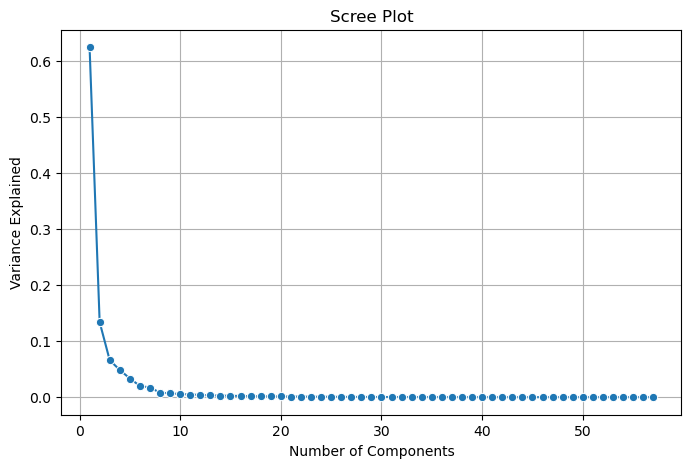

In [193]:
plt.figure(figsize=(8,5))
sns.lineplot(y=pca.explained_variance_ratio_ ,x=range(1,58),marker='o')
plt.xlabel('Number of Components',fontsize=10)
plt.ylabel('Variance Explained',fontsize=10)
plt.title('Scree Plot',fontsize=12)
plt.grid()
plt.show()

In [194]:
np.cumsum(pca.explained_variance_ratio_)

array([0.62444145, 0.75832974, 0.82435265, 0.87299974, 0.90640271,
       0.92663251, 0.94393397, 0.95207264, 0.95902156, 0.96466793,
       0.96945356, 0.97358126, 0.97675877, 0.97972332, 0.98215096,
       0.98445448, 0.98627285, 0.98794626, 0.98945019, 0.99086751,
       0.99202391, 0.99312884, 0.99397446, 0.99477935, 0.99554613,
       0.9961055 , 0.99660681, 0.99708936, 0.99749984, 0.99788572,
       0.99821413, 0.99849265, 0.99873781, 0.99894611, 0.99914077,
       0.99929979, 0.99942681, 0.99953668, 0.99962348, 0.99970417,
       0.99976476, 0.99980302, 0.99984042, 0.99987407, 0.99989927,
       0.99991853, 0.99993544, 0.99995055, 0.99996197, 0.99997207,
       0.9999797 , 0.99998619, 0.99999156, 0.9999952 , 0.99999762,
       0.99999919, 1.        ])

In [195]:
### taking 7 PCs as the variance differs till then but flattens after that in the scree plot
### used elbow method to find the cut off
def pcs_2():
    columns=[]
    for p in range(1,8):
        pc = f'PC{p}'
        columns.append(pc)
    return columns

In [196]:
df_selected = df_extracted_loadings[pcs_2()]

In [197]:
df_selected.T

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
PC1,0.149222,0.159169,0.158209,0.156340,0.156814,0.143350,0.143537,0.018849,0.017878,0.155152,...,0.142987,0.133784,0.062964,0.056741,0.119102,0.113044,0.142140,0.141370,0.147629,0.142103
PC2,-0.115487,-0.080239,-0.093718,-0.020341,-0.014310,-0.079667,-0.087098,0.069101,0.067316,-0.105986,...,0.136839,0.166416,0.281881,0.287541,0.182341,0.177112,0.052925,0.035109,-0.049122,-0.039848
PC3,0.101528,-0.038662,0.028959,-0.074419,-0.068223,-0.037619,0.021350,0.323827,0.338705,-0.032107,...,-0.103565,0.033423,-0.120293,-0.088097,0.026176,0.164774,-0.144419,-0.102175,-0.126673,-0.028545
PC4,0.076814,0.052976,0.070022,0.028520,0.016398,0.010210,0.016244,0.091143,0.079554,0.089187,...,-0.018223,0.005954,0.208941,0.240499,-0.240416,-0.189408,-0.167554,-0.169020,0.024036,0.057402
PC5,-0.012090,-0.042344,-0.022927,-0.080339,-0.078326,-0.167893,-0.158092,0.418412,0.415965,-0.014033,...,0.094293,0.112351,-0.018070,-0.036293,0.016981,0.047538,0.014187,0.047504,0.191790,0.249765
PC6,0.082558,0.073667,0.082812,0.092379,0.080010,0.050969,0.054568,-0.231809,-0.214542,0.081378,...,0.111045,0.185882,-0.004600,0.022023,0.109387,0.189006,-0.149689,-0.233858,0.022904,0.042834
PC7,0.106896,-0.124085,-0.010291,-0.200807,-0.203411,-0.040399,0.053990,-0.355238,-0.327677,-0.067062,...,-0.025902,0.178500,0.009474,0.066497,-0.082858,0.109686,-0.050786,0.194686,-0.016338,0.175252


### Part 2 - PCA: Compare PCs with Actual Columns and identify which is explaining most variance. Write inferences about all the Principal components in terms of actual variables.

In [198]:
from matplotlib.patches import Rectangle

In [199]:
fig,ax = plt.subplots(figsize=(300, 250), facecolor='w', edgecolor='k')
sns.set(font_scale=15)
ax = sns.heatmap(df_selected, annot=True, cmap='crest', cbar=False, fmt='.2g', ax=ax,
                 xticklabels=['PC1','PC2','PC3','PC4','PC5','PC6','PC7'])

column_max = df_selected.abs().idxmax(axis=0)

for col, variable in enumerate(df_selected.columns):
    position = df_selected.index.get_loc(column_max[variable])
    ax.add_patch(Rectangle((col, position),1,1, fill=False, edgecolor='red', lw=15))

In [200]:
df_final_pca = pd.DataFrame(df_pca,columns=(['TOT_F','MARG_AL_0_3_F','MAIN_AL_F','MARG_AL_3_6_F','F_ST',
                                               'MARG_OT_3_6_F','M_ST']))
df_final_pca.head()

,TOT_F,MARG_AL_0_3_F,MAIN_AL_F,MARG_AL_3_6_F,F_ST,MARG_OT_3_6_F,M_ST
0,29796.0,237.0,143.0,343.0,2598.0,198.0,1999.0
1,23102.0,229.0,108.0,432.0,517.0,449.0,427.0
2,10964.0,89.0,71.0,1161.0,9723.0,28.0,5806.0
3,4206.0,128.0,24.0,158.0,3968.0,33.0,2666.0
4,29981.0,1043.0,237.0,1419.0,10843.0,214.0,7670.0


##### The following 7 features are finalized after performing PCA on the data set which initially had 57 features:
#### a) TOT_F - Total population Female
#### b) M_ST - Scheduled Tribes population Male
#### c) F_ST - Scheduled Tribes population Female
#### d) MAIN_AL_F - Main Agricultural Labourers Population Female
#### e ) MARG_AL_3_6_F - Marginal Agriculture Labourers Population 3-6 Female
#### f) MARG_OT_3_6_F - Marginal Other Workers Population Person 3-6 Female
#### g) MARG_AL_0_3_F - Marginal Agriculture Labourers Population 0-3 Female

In [201]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

In [202]:
df_cat = pd.DataFrame(df,columns=(['State','Area Name']))
df_cat

,State,Area Name
0,Jammu & Kashmir,Kupwara
1,Jammu & Kashmir,Badgam
2,Jammu & Kashmir,Leh(Ladakh)
3,Jammu & Kashmir,Kargil
4,Jammu & Kashmir,Punch
...,...,...
635,Puducherry,Mahe
636,Puducherry,Karaikal
637,Andaman & Nicobar Island,Nicobars
638,Andaman & Nicobar Island,North & Middle Andaman


In [203]:
df_final = pd.concat([df_cat, df_final_pca], axis=1, join='inner')

In [204]:
df_final.head()

,State,Area Name,TOT_F,MARG_AL_0_3_F,MAIN_AL_F,MARG_AL_3_6_F,F_ST,MARG_OT_3_6_F,M_ST
0,Jammu & Kashmir,Kupwara,29796.0,237.0,143.0,343.0,2598.0,198.0,1999.0
1,Jammu & Kashmir,Badgam,23102.0,229.0,108.0,432.0,517.0,449.0,427.0
2,Jammu & Kashmir,Leh(Ladakh),10964.0,89.0,71.0,1161.0,9723.0,28.0,5806.0
3,Jammu & Kashmir,Kargil,4206.0,128.0,24.0,158.0,3968.0,33.0,2666.0
4,Jammu & Kashmir,Punch,29981.0,1043.0,237.0,1419.0,10843.0,214.0,7670.0


### Part 2 - PCA: Write linear equation for first PC.

In [205]:
for i in range(0,7):
    print("(",np.round(pca.components_[0][i],2),")",'*',df_selected.columns[i],end=' + ')

( 0.15 ) * PC1 + ( 0.16 ) * PC2 + ( 0.16 ) * PC3 + ( 0.16 ) * PC4 + ( 0.16 ) * PC5 + ( 0.14 ) * PC6 + ( 0.14 ) * PC7 + 